# Stacking Early Fusion model with Character Insertion and Deletion- InceptionV3 + BERT/LSTM

In [65]:
# Install BERT for tf2 module
%pip install bert-for-tf2
# Install Keras version 2.3.1
%pip install keras==2.13.1

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [66]:
# Import all necessary libraries
try:
    %tensorflow_version 2.x
except Exception:
    pass
import tensorflow as tf
import tensorflow_hub as hub
from keras import layers
from keras import callbacks
from keras import optimizers
from keras import utils
from keras import models
from keras.preprocessing.image import ImageDataGenerator 
from keras import applications
from keras.applications.inception_v3 import InceptionV3
from keras.regularizers import l2, l1

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix

import bert

import numpy as np 
import pandas as pd
import re
import glob
import os
import cv2
import sys
import pickle
import random

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [67]:
def char_insertion(sentence, n):
    # Define function to insert a random character into the sentence
    def insert_char(sentence):
        index = random.randint(0, len(sentence))
        random_char = random.choice('abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ')
        return sentence[:index] + random_char + sentence[index:]

    # Insert a random character into the entire sentence 'n' times
    modified_sentence = sentence
    for _ in range(n):
        modified_sentence = insert_char(modified_sentence)

    return modified_sentence



I like fzluffy cats


In [68]:
def char_deletion(sentence, p):
    # Delete characters from the entire sentence with probability 'p'
    modified_sentence = ''.join([char if random.random() > p else '' for char in sentence])

    return modified_sentence



I like fluffy cats


In [69]:
# Define the function to apply random transformations
def apply_random_transformation(row):
    functions = [char_deletion, char_insertion]
    selected_function = random.choice(functions)
    
    if selected_function == char_deletion:
        probability = .1
        return selected_function(row['text'], p=probability)
    else:
        return selected_function(row['text'], n=7)

In [70]:
# Import the training and test .csv files
colnames=['image_path', 'text', 'food']
train = pd.read_csv('train_titles.csv', names=colnames, header=None, sep = ',', index_col=['image_path'])
test = pd.read_csv('test_titles.csv', names=colnames, header=None, sep = ',', index_col=['image_path'])

#train = pd.read_csv('train_titles_10x10.csv', names=colnames, header=None, sep = ',')
#test = pd.read_csv('test_titles_10x10.csv', names=colnames, header=None, sep = ',')

train = train.dropna()
test = test.dropna()




In [71]:
# Sort values by 'image_path'
test = test.sort_values('image_path')
train = train.sort_values('image_path')

In [72]:
print(train.shape)
train.head()

(67972, 2)


,text,food
image_path,,
apple_pie_0.jpg,Apple pie - Wikipedia,apple_pie
apple_pie_100.jpg,Glazed Apple Pie Squares Recipe | Taste of Home,apple_pie
apple_pie_101.jpg,Mock Apple Pie Recipe - Allrecipes.com,apple_pie
apple_pie_102.jpg,Crock-Pot Ladies Crock-Pot Apple Pie Moonshine,apple_pie
apple_pie_104.jpg,All-Star Apple Pie Recipe | Taste of Home,apple_pie


In [73]:
# Apply the random transformation to each row of the 'text' column
train['text'] = train.apply(apply_random_transformation, axis=1)
# Apply the random transformation to each row of the 'text' column
test['text'] = train.apply(apply_random_transformation, axis=1)

In [74]:
train.head()

,text,food
image_path,,
apple_pie_0.jpg,Apl pie - ikipedia,apple_pie
apple_pie_100.jpg,GlazSed ApNple Pie Squbares Recipe | Tsaste oI...,apple_pie
apple_pie_101.jpg,ck Apple Pe Recipe - Allrecips.com,apple_pie
apple_pie_102.jpg,CrmocDk-xPot Ladies Crock-Pot ApVple Pie MoAo...,apple_pie
apple_pie_104.jpg,AllStar Appl Pie Recipe | Taste of ome,apple_pie


In [75]:
def get_missing(file, df):
  parts = file.split(os.sep)
  idx = parts[-1]
  cls = parts[-2]
  indexes = df[:,0]
  classes = df[:,2]

  if idx in indexes:
    text = df[idx == indexes][0,1]
    return pd.NA, pd.NA, pd.NA
  else:
    text = df[cls == classes][0,1]
    
  return idx, text, cls   

vec_get_missing = np.vectorize(get_missing, signature='(),(m,n)->(),(),()')  

In [76]:
# Function for images loading

def add_not_found(path, df):
  files = glob.glob(path)
  df = df.reset_index()
  idxs, texts, cls = vec_get_missing(files, df.values)
  
  found = pd.DataFrame({"text": texts,
                        "food": cls,
                       "image_path": idxs})
  na = found.isna().sum().values[0]
  if na<found.shape[0]:
    df = df.append(found)
  df = df.drop_duplicates(subset='image_path', keep='first').dropna()
  df = df.set_index('image_path')
  df = shuffle(df, random_state = 0)
  return df      

In [77]:
# Images folders 
train = add_not_found('train/*/*.jpg', train)
test = add_not_found('test/*/*.jpg', test)

print("Number of training images:",train.shape[0])
print("Number of test images:",test.shape[0])

C:\Users\chris\AppData\Local\Temp\ipykernel_6412\808448654.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(found)


Number of training images: 67988
Number of test images: 0


In [78]:
# Import the BERT BASE model from Tensorflow HUB (layer, vocab_file and tokenizer)
BertTokenizer = bert.bert_tokenization.FullTokenizer
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/1",
                            trainable=False)
vocabulary_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
to_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = BertTokenizer(vocabulary_file, to_lower_case)

In [79]:
# Preprocessing of texts according to BERT +
# Cleaning of the texts

def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)
    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)
    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)
    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)
    sentence = sentence.lower()
    return sentence

def remove_tags(text):
    return TAG_RE.sub('', text)

TAG_RE = re.compile(r'<[^>]+>')
vec_preprocess_text = np.vectorize(preprocess_text)

def get_tokens(text, tokenizer):
  tokens = tokenizer.tokenize(text)
  tokens = ["[CLS]"] + tokens + ["[SEP]"]
  length = len(tokens)
  if length > max_length:
      tokens = tokens[:max_length]
  return tokens, length  

def get_masks(text, tokenizer, max_length):
    """Mask for padding"""
    tokens, length = get_tokens(text, tokenizer)
    return np.asarray([1]*len(tokens) + [0] * (max_length - len(tokens)))
vec_get_masks = np.vectorize(get_masks, signature = '(),(),()->(n)')

def get_segments(text, tokenizer, max_length):
    """Segments: 0 for the first sequence, 1 for the second"""
    tokens, length = get_tokens(text, tokenizer)
    segments = []
    current_segment_id = 0
    for token in tokens:
        segments.append(current_segment_id)
        if token == "[SEP]":
            current_segment_id = 1
    return np.asarray(segments + [0] * (max_length - len(tokens)))
vec_get_segments = np.vectorize(get_segments, signature = '(),(),()->(n)')

def get_ids(text, tokenizer, max_length):
    """Token ids from Tokenizer vocab"""
    tokens, length = get_tokens(text, tokenizer)
    token_ids = tokenizer.convert_tokens_to_ids(tokens)
    input_ids = np.asarray(token_ids + [0] * (max_length-length))
    return input_ids
vec_get_ids = np.vectorize(get_ids, signature = '(),(),()->(n)')

def get_texts(path):
    path = path.decode('utf-8')
    parts = path.split(os.sep)
    image_name = parts[-1]
    is_train = parts[-3] == 'train'
    if is_train:
      df = train
    else:
      df = test

    text = df['text'][image_name]
    return text
vec_get_text = np.vectorize(get_texts)
def prepare_text(paths):
    #Preparing texts
    
    texts = vec_get_text(paths)
    
    text_array = vec_preprocess_text(texts)
    ids = vec_get_ids(text_array, 
                      tokenizer, 
                      max_length).squeeze().astype(np.int32)
    masks = vec_get_masks(text_array,
                          tokenizer,
                          max_length).squeeze().astype(np.int32)
    segments = vec_get_segments(text_array,
                                tokenizer,
                                max_length).squeeze().astype(np.int32)
    
    return ids, segments, masks

def clean(i, tokens):
  try:
    this_token = tokens[i]
    next_token = tokens[i+1]
  except:
    return tokens
  if '##' in next_token:
      tokens.remove(next_token)
      tokens[i] = this_token + next_token[2:]
      tokens = clean(i, tokens)
      return tokens
  else:
    i = i+1
    tokens = clean(i, tokens)
    return tokens

def clean_text(array):
  array = array[(array!=0) & (array != 101) & (array != 102)]
  tokens = tokenizer.convert_ids_to_tokens(array)
  tokens = clean(0, tokens)
  text = ' '.join(tokens)
  return text

In [80]:
# Images preprocessing
def load_image(path):
    path = path.decode('utf-8')
    image = cv2.imread(path)
    image = cv2.resize(image, (img_width, img_height))
    image = image/255
    image = image.astype(np.float32)
    parts = path.split(os.sep)
    labels = parts[-2] == Classes 
    labels = labels.astype(np.int32)
    
    return image, labels
    
vec_load_image = np.vectorize(load_image, signature = '()->(r,c,d),(s)')

In [81]:
# Dataset creation
def prepare_data(paths):
    #Images and labels
    images, labels = tf.numpy_function(vec_load_image, 
                                      [paths], 
                                      [tf.float32, 
                                        tf.int32])
    
    
    [ids, segments, masks, ] = tf.numpy_function(prepare_text, 
                                              [paths], 
                                              [tf.int32, 
                                               tf.int32,
                                               tf.int32])
    images.set_shape([None, img_width, img_height, depth])
    labels.set_shape([None, nClasses])
    ids.set_shape([None, max_length])
    masks.set_shape([None, max_length])
    segments.set_shape([None, max_length])
    return ({"input_word_ids": ids, 
             "input_mask": masks,  
             "segment_ids": segments, 
             "image": images},
            {"class": labels})
    

    return dataset

In [82]:
# Parameters setting: images width and height, depth, number if classes, input shape
batch_size =  80
img_width = 299
img_height = 299
depth = 3
max_length = 20 #Setup according to the text

nClasses = train.food.nunique()
Classes = train.food.unique()
input_shape = (img_width, img_height, depth)

In [83]:
# Images loading using tf.data
def tf_data(path, batch_size):
    paths = tf.data.Dataset.list_files(path)
    paths = paths.batch(64)
    dataset = paths.map(prepare_data, tf.data.experimental.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    dataset = dataset.unbatch()
    dataset = dataset.batch(batch_size)
    dataset = dataset.repeat()
    return dataset   
data_train = tf_data('train/*/*.jpg', batch_size)
data_test = tf_data('test/*/*.jpg', batch_size)

**Plot some samples of images with related text**

In [84]:
ip, op = next(iter(data_train))

images = ip['image'][:16]
input_word_ids = ip['input_word_ids'][:16]
true_labels =  op['class'][:16]

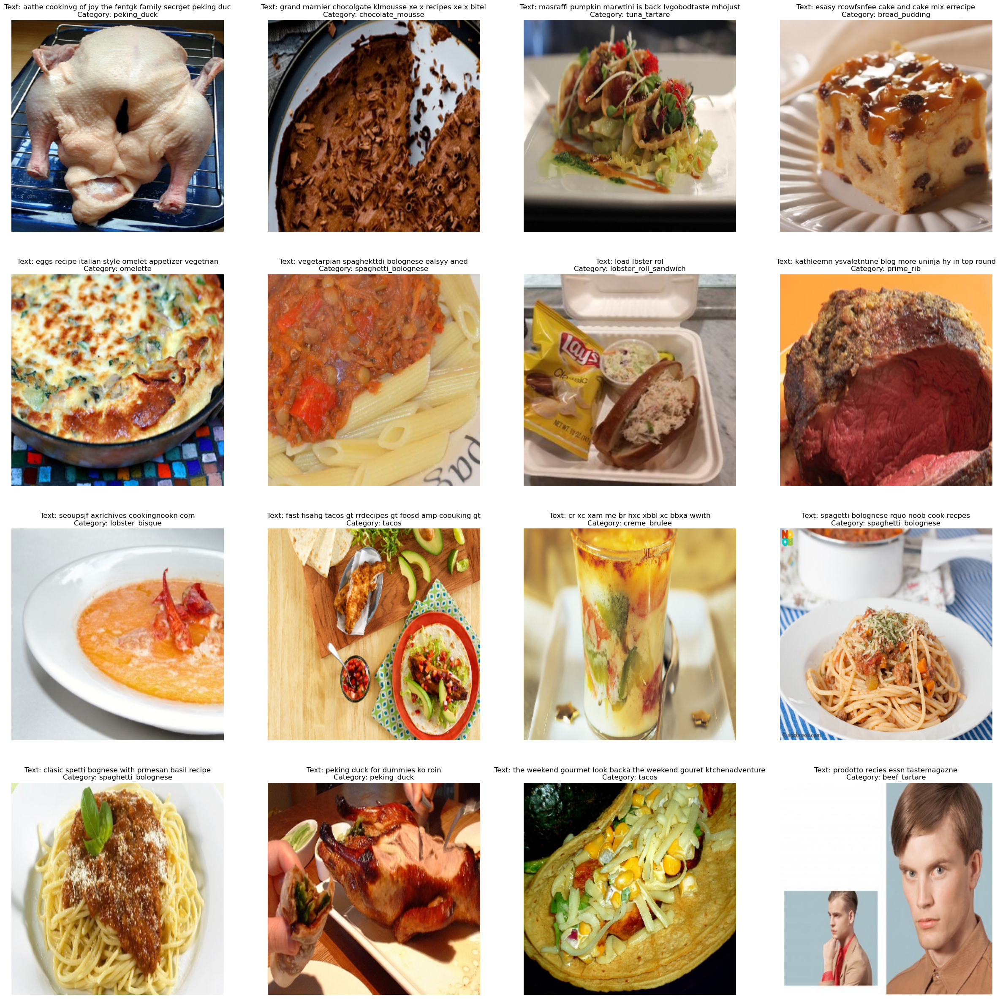

In [85]:
# Print images and related texts before classification
i=1
texts = [clean_text(array) for array in input_word_ids.numpy()]
plt.figure(figsize=(30,30))
for image, label, text in zip(images.numpy(), true_labels.numpy(), texts):
      plt.subplot(4,4,i)
      i+=1
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.imshow(image)
      plt.axis('off')
      plt.title("Text: {}\nCategory: {}".format(text, Classes[label.argmax(0)]))
plt.show()

**Classification Model**

In [86]:
# Images Model
model_cnn = models.Sequential()
model_cnn.add(InceptionV3(weights='imagenet', include_top=False, input_tensor=layers.Input(shape=(299, 299, 3))))
model_cnn.add(layers.AveragePooling2D(pool_size=(8, 8), name='AVG_Pooling'))
model_cnn.add(layers.Dropout(.4, name='Dropout_0.4'))
model_cnn.add(layers.Flatten(name='Flatten'))
model_cnn.add(layers.Dense(128, name='Dense_128'))

In [87]:
# Keep model layers trainable
for layer in model_cnn.layers:
    layer.trainable = True

In [88]:
#-----------------------SUMMARY IMAGES MODEL--------------------------------------------------------------#

In [89]:
model_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 AVG_Pooling (AveragePoolin  (None, 1, 1, 2048)        0         
 g2D)                                                            
                                                                 
 Dropout_0.4 (Dropout)       (None, 1, 1, 2048)        0         
                                                                 
 Flatten (Flatten)           (None, 2048)              0         
                                                                 
 Dense_128 (Dense)           (None, 128)               262272    
                                                                 
Total params: 22065056 (84.17 MB)
Trainable params: 22030624 (84.04 MB)
Non-trainable params: 34432 (134.50 KB)
__________

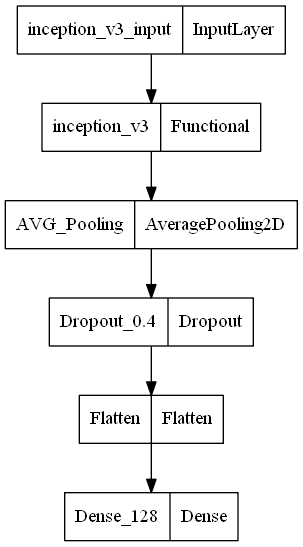

In [90]:
from keras.utils import plot_model
plot_model(model_cnn, to_file='model_cnn.png')

In [91]:
#------------------------------------------------------------------------------------------------------------#

In [92]:
# Bert + LSTM text model
input_ids = layers.Input(shape=(max_length,), dtype=tf.int32, name="input_word_ids")
input_masks = layers.Input(shape=(max_length,), dtype=tf.int32, name="input_masks")
input_segments = layers.Input(shape=(max_length,), dtype=tf.int32, name="segment_ids")
_, seq_out = bert_layer([input_ids, input_masks, input_segments])
out = layers.LSTM(128, name='LSTM')(seq_out)
model_lstm = models.Model([input_ids, input_masks, input_segments], out)

In [93]:
# Keep the Bert + LSTM layers trainable
for layer in model_lstm.layers:
    layer.trainable = True

In [94]:
#-----------------------SUMMARY TEXT MODEL--------------------------------------------------------------#

In [95]:
model_lstm.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_word_ids (InputLayer  [(None, 20)]                 0         []                            
 )                                                                                                
                                                                                                  
 input_masks (InputLayer)    [(None, 20)]                 0         []                            
                                                                                                  
 segment_ids (InputLayer)    [(None, 20)]                 0         []                            
                                                                                                  
 keras_layer (KerasLayer)    [(None, 768),                1094822   ['input_word_ids[0][0]',  

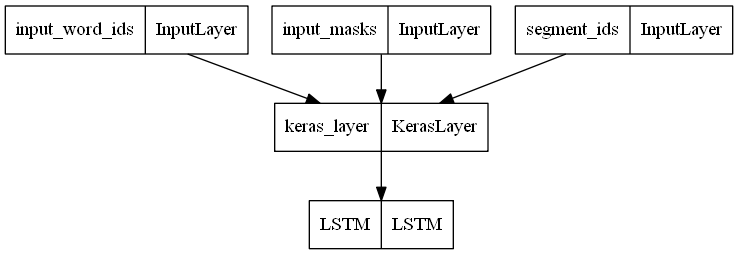

In [96]:
plot_model(model_lstm, to_file='bert_lstm.png')

In [97]:
#------------------------------------------------------------------------------------------------------------#

In [98]:
# Stacking early-fusion multimodal model

input_word_ids = layers.Input(shape=(max_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = layers.Input(shape=(max_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = layers.Input(shape=(max_length,), dtype=tf.int32,
                                    name="segment_ids")
image_input = layers.Input(shape = input_shape, dtype=tf.float32,
                           name = "image")

image_side = model_cnn(image_input)
text_side = model_lstm([input_word_ids, input_mask, segment_ids])
# Concatenate features from images and texts
merged = layers.Concatenate()([image_side, text_side])
merged = layers.Dense(256, activation = 'relu')(merged)
output = layers.Dense(nClasses, activation='softmax', name = "class")(merged)

In [99]:
model = models.Model([input_word_ids, input_mask, segment_ids, image_input], output)

In [100]:
#-----------------------SUMMARY MULTIMODAL MODEL--------------------------------------------------------------#

In [101]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 image (InputLayer)          [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 input_word_ids (InputLayer  [(None, 20)]                 0         []                            
 )                                                                                                
                                                                                                  
 input_mask (InputLayer)     [(None, 20)]                 0         []                            
                                                                                                  
 segment_ids (InputLayer)    [(None, 20)]                 0         []                      

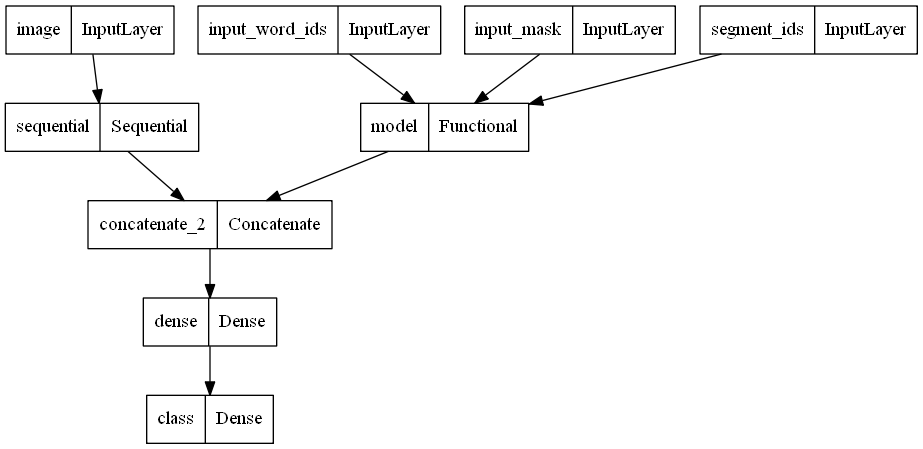

In [102]:
from keras.utils import plot_model
plot_model(model, to_file='multimodal.png')

In [103]:
#------------------------------------------------------------------------------------------------------------#

In [104]:
# Stochastic Gradient Descent optimizer
sgd = optimizers.SGD(learning_rate=0.0001, momentum=0.9, nesterov=False)

# Compile model
model.compile(loss='categorical_crossentropy', 
              optimizer=sgd, 
              metrics=['accuracy'])

In [105]:
# Setup callbacks, logs and early stopping condition
checkpoint_path = "char_stacking_early_fusion/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
cp = callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy',save_best_only=True,verbose=1, mode='max')
csv_logger = callbacks.CSVLogger('char_stacking_early_fusion/char_stacking_early.log')
es = callbacks.EarlyStopping(patience = 3, restore_best_weights=True)

In [106]:
# Reduce learning rate if no improvement is observed
reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_accuracy', factor=0.1, patience=1, min_lr=0.00001)

In [107]:
# Load model weights
#model.load_weights('stacking_early_fusion/weights-improvement-16-0.92.hdf5')

In [108]:
# Training
history = model.fit(data_train,
                    epochs=1,
                    steps_per_epoch = train.shape[0]//batch_size,
                    validation_data = data_test,
                    validation_steps = test.shape[0]//batch_size,
                    callbacks=[cp, csv_logger, reduce_lr])

849/849 [==============================] - ETA: 0s - loss: 4.6452 - accuracy: 0.0125 

KeyError: 'Failed to format this callback filepath: "char_stacking_early_fusion/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5". Reason: \'val_accuracy\''

In [ ]:
# Plot training and test accuracy using Plotly library
df = pd.read_csv('char_stacking_early_fusion/char_stacking_early.log')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['epoch'], y=df['accuracy'],
                    mode='lines',
                    name='training'))

fig.add_trace(go.Scatter(x=df['epoch'], y=df['val_accuracy'],
                    mode='lines',
                    name='test'))

fig.update_layout(
    font_size = 20,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='Gray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='Gray')

In [ ]:
# Plot training and test loss using Plotly library
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['epoch'], y=df['loss'],
                    mode='lines',
                    name='training'))

fig.add_trace(go.Scatter(x=df['epoch'], y=df['val_loss'],
                    mode='lines',
                    name='test'))

fig.update_layout(
    font_size = 20,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='Gray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='Gray')

In [ ]:
# Model evaluation on test set
model.evaluate(data_test,
               steps = test.shape[0]//batch_size)

#[4.547471523284912, 0.031095406040549278]

283/283 [==============================] - 1796s 6s/step - loss: 4.5475 - accuracy: 0.0311


[4.547471523284912, 0.031095406040549278]

**Plot some predictions**

In [ ]:
ip, op = next(iter(data_test))
images = ip['image'][:16]

input_masks = ip['input_mask'][:16]
input_word_ids = ip['input_word_ids'][:16]
input_segments = ip['segment_ids'][:16]

true_labels =  op['class'][:16]

In [ ]:
pred_labels = model.predict([input_word_ids,
                             input_masks,
                             input_segments,
                             images])

1/1 [==============================] - 4s 4s/step


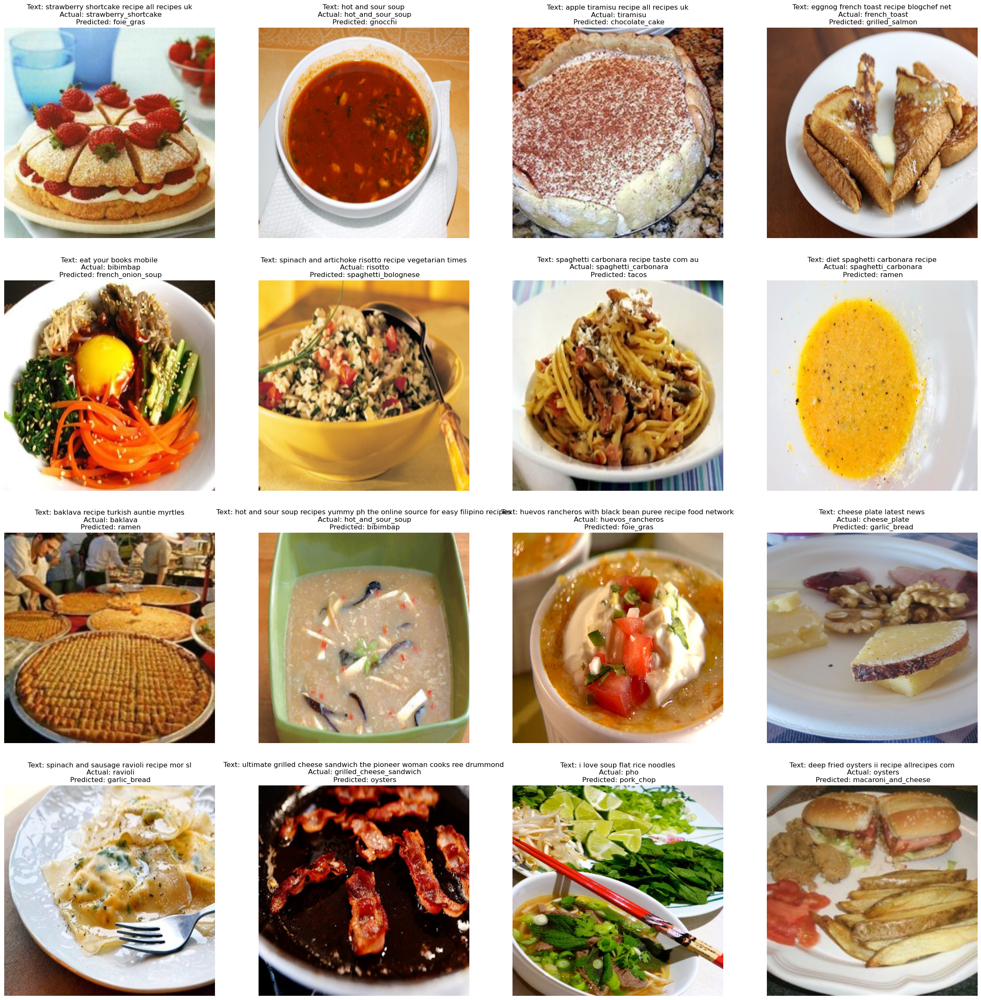

In [ ]:
i=1
texts = [clean_text(array) for array in input_word_ids.numpy()[:16]]
plt.figure(figsize=(30,30))
for image, actual_label, label, text in zip(images.numpy()[:16], true_labels.numpy()[:16], pred_labels, texts):
      plt.subplot(4,4,i)
      i+=1
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.imshow(image)
      plt.axis('off')
      plt.title("Text: {}\n Actual: {}\n Predicted: {}".format(text, Classes[actual_label.argmax(0)], Classes[label.argmax(0)]))
      plt.xlabel(text)
plt.show()